In [2]:
import os
import requests
import numpy as np
import astropy.units as u
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as PathEffects

from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.colors import LogNorm
from reproject import reproject_interp
from astropy.coordinates import SkyCoord, Angle
from matplotlib.patches import Polygon, FancyArrow
from reproject.healpix import reproject_from_healpix
from astropy.visualization import ZScaleInterval, ImageNormalize, PercentileInterval, AsinhStretch

font = {'family' : 'gill sans',
         'serif':  'cmr10'
         }

plt.rc('font', **font)
plt.rc('axes', unicode_minus = False)

smc_center = SkyCoord("00h52m44.8s", "-72d49m43s", frame = "icrs")

hips = "CDS/P/DSS2/red"
projection = "SIN"
fov_deg = 12.0
width = 3000
height = 3000

base = "https://alasky.cds.unistra.fr/hips-image-services/hips2fits"

params = {
    "hips": hips,
    "ra": smc_center.ra.deg,
    "dec": smc_center.dec.deg,
    "fov": fov_deg,
    "width": width,
    "height": height,
    "projection": projection,
    "format": "fits",
}

out_fits = "SMC_DSS2_red.fits"

if not os.path.exists(out_fits):
    with requests.Session() as s:
        r = s.get(base, params = params, stream = True, timeout = (30, 600))
        r.raise_for_status()
        with open(out_fits, "wb") as f:
            for chunk in r.iter_content(chunk_size = 1024 * 1024):
                if chunk:
                    f.write(chunk)

hips = "CDS/P/DSS2/blue"

params = {
    "hips": hips,
    "ra": smc_center.ra.deg,
    "dec": smc_center.dec.deg,
    "fov": fov_deg,
    "width": width,
    "height": height,
    "projection": projection,
    "format": "fits",
}

out_fits = "SMC_DSS2_blue.fits"

if not os.path.exists(out_fits):
    with requests.Session() as s:
        r = s.get(base, params = params, stream = True, timeout = (30, 600))
        r.raise_for_status()
        with open(out_fits, "wb") as f:
            for chunk in r.iter_content(chunk_size = 1024 * 1024):
                if chunk:
                    f.write(chunk)

hips = "CDS/P/DSS2/NIR"

params = {
    "hips": hips,
    "ra": smc_center.ra.deg,
    "dec": smc_center.dec.deg,
    "fov": fov_deg,
    "width": width,
    "height": height,
    "projection": projection,
    "format": "fits",
}

out_fits = "SMC_DSS2_NIR.fits"

if not os.path.exists(out_fits):
    with requests.Session() as s:
        r = s.get(base, params = params, stream = True, timeout = (30, 600))
        r.raise_for_status()
        with open(out_fits, "wb") as f:
            for chunk in r.iter_content(chunk_size = 1024 * 1024):
                if chunk:
                    f.write(chunk)

lmc_center = SkyCoord("05h23m34.6s", "-69d45m22s", frame = "icrs")

hips = "CDS/P/DSS2/red"
projection = "SIN"
fov_deg = 12.0
width = 3000
height = 3000

base = "https://alasky.cds.unistra.fr/hips-image-services/hips2fits"

params = {
    "hips": hips,
    "ra": lmc_center.ra.deg,
    "dec": lmc_center.dec.deg,
    "fov": fov_deg,
    "width": width,
    "height": height,
    "projection": projection,
    "format": "fits",
}

out_fits = "LMC_DSS2_red.fits"

if not os.path.exists(out_fits):
    with requests.Session() as s:
        r = s.get(base, params = params, stream = True, timeout = (30, 600))
        r.raise_for_status()
        with open(out_fits, "wb") as f:
            for chunk in r.iter_content(chunk_size = 1024 * 1024):
                if chunk:
                    f.write(chunk)

hips = "CDS/P/DSS2/blue"

params = {
    "hips": hips,
    "ra": lmc_center.ra.deg,
    "dec": lmc_center.dec.deg,
    "fov": fov_deg,
    "width": width,
    "height": height,
    "projection": projection,
    "format": "fits",
}

out_fits = "LMC_DSS2_blue.fits"

if not os.path.exists(out_fits):
    with requests.Session() as s:
        r = s.get(base, params = params, stream = True, timeout = (30, 600))
        r.raise_for_status()
        with open(out_fits, "wb") as f:
            for chunk in r.iter_content(chunk_size = 1024 * 1024):
                if chunk:
                    f.write(chunk)

hips = "CDS/P/DSS2/NIR"

params = {
    "hips": hips,
    "ra": lmc_center.ra.deg,
    "dec": lmc_center.dec.deg,
    "fov": fov_deg,
    "width": width,
    "height": height,
    "projection": projection,
    "format": "fits",
}

out_fits = "LMC_DSS2_NIR.fits"

if not os.path.exists(out_fits):
    with requests.Session() as s:
        r = s.get(base, params = params, stream = True, timeout = (30, 600))
        r.raise_for_status()
        with open(out_fits, "wb") as f:
            for chunk in r.iter_content(chunk_size = 1024 * 1024):
                if chunk:
                    f.write(chunk)

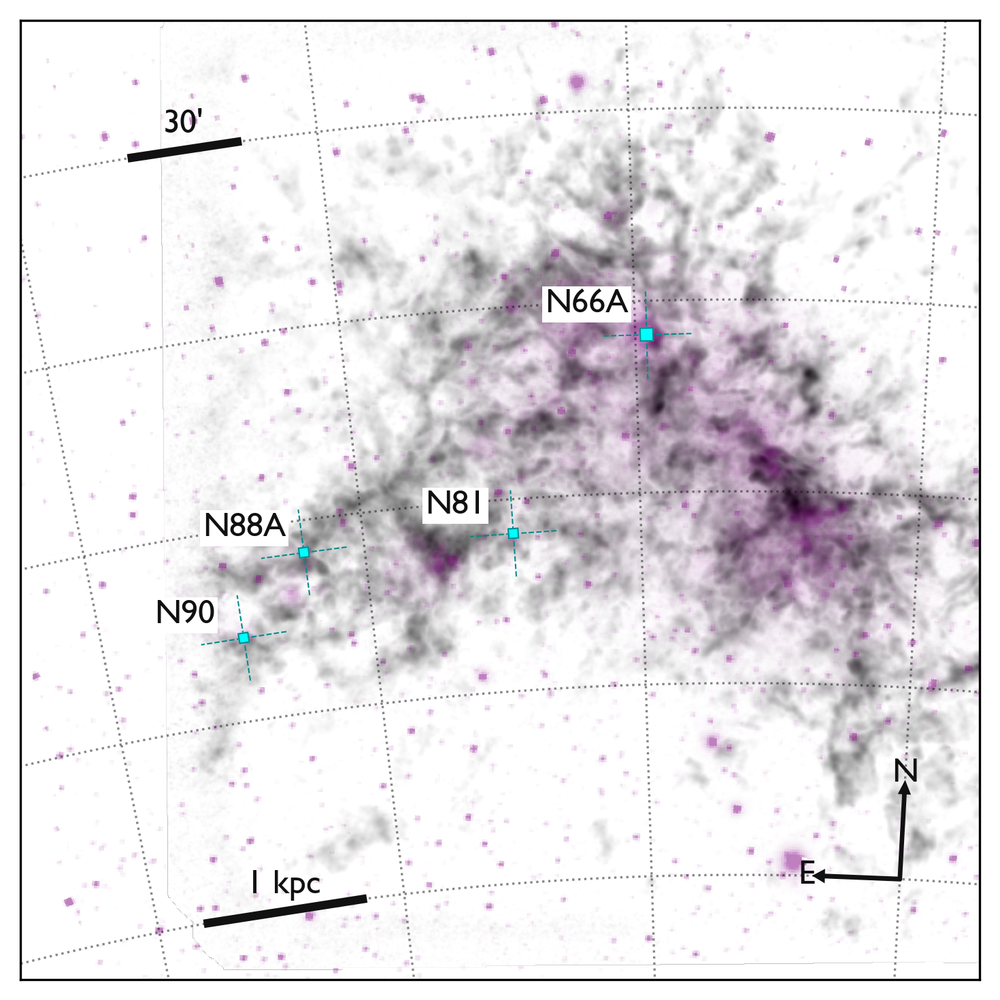

In [29]:
little_boxes_on_the_hillside_color = "#111111" #470a0a
little_boxes_full_of_ticky_tacky_color = "#C79900"

little_boxes_on_the_hillside_color = "white" #470a0a
little_boxes_full_of_ticky_tacky_color = "#00FFFF"

#111111

fits_path_red = "SMC_DSS2_red.fits"

fits_path_atca_hi = "/Users/billyli/Documents/float-for-morrow/smcU_peak_Temp.fits"

def load_2d_fits(path):
    hdul = fits.open(path)
    hdu = hdul[0]
    data = hdu.data
    wcs = WCS(hdu.header)
    if data is not None and data.ndim > 2:
        data = np.squeeze(data)
    return data, wcs, hdul

red, wcs_r, hdul_r = load_2d_fits(fits_path_red)

target_wcs = wcs_r
target_shape = red.shape

hi_data, hi_wcs_full, hi_hdul = load_2d_fits(fits_path_atca_hi)

hi_wcs_2d = hi_wcs_full.celestial

hi_atca_projected, _ = reproject_interp((hi_data, hi_wcs_2d), target_wcs, shape_out = target_shape)

slit_position = SkyCoord('01h24m08.3s', '−73d09m04.6s', frame = 'icrs')
ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 - 1 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 - 1 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

fig = plt.figure(figsize = (5, 5), dpi = 300)
ax = fig.add_subplot(111, projection = target_wcs)

zoom_width = 300 * u.arcmin
zoom_height = 300 * u.arcmin

x_center_sky = SkyCoord("01h10m00.0s", "-73d00m00s", frame = "icrs")
x_center, y_center = target_wcs.world_to_pixel(x_center_sky)
cdelt = np.abs(target_wcs.wcs.cdelt)
pixscale_deg = cdelt[0]

zoom_width_pix  = (zoom_width.to(u.deg).value)  / pixscale_deg
zoom_height_pix = (zoom_height.to(u.deg).value) / pixscale_deg

ax.set_xlim(x_center - zoom_width_pix / 2, x_center + zoom_width_pix / 2)
ax.set_ylim(y_center - zoom_height_pix / 2, y_center + zoom_height_pix / 2)

light_purple_hex = "#800080" 
purple_cmap = mcolors.LinearSegmentedColormap.from_list("purple", ["#80008000", "#800080FF"])
        
im = ax.imshow(hi_atca_projected, origin = "lower", cmap = "grey_r", vmin = 10, zorder = -1)

ha_data, ha_wcs_full, ha_hdul = load_2d_fits("/Users/billyli/Documents/float-for-morrow/skv1574913653568.fits")

ha_reprojected, footprint = reproject_interp((ha_data, ha_wcs_full), target_wcs, shape_out = target_shape)

im_ha = ax.imshow(ha_reprojected, origin = 'lower', cmap = purple_cmap, alpha = 0.5, norm = LogNorm(vmin = 1000, vmax = 5000))

# cbar_ha = plt.colorbar(im_ha, ax = ax, pad = 0.1)
# cbar_ha.set_label(r'H$\alpha$ Intensity (dR)')

# cbar = plt.colorbar(im)
# cbar.set_label(r'HI 21 cm T$_{\text{peak}}$')

ax.set_xlabel("RA")
ax.set_ylabel("Dec")
ax.grid(color = "#111111", ls = ":", alpha = 0.5)

ax.coords[0].set_major_formatter("hh:mm:ss")
ax.coords[1].set_major_formatter("dd:mm")

poly = Polygon(corners, closed = True, fill = True, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, facecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = 'darkcyan', transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)

ra_center = (ra_min_w + ra_max_w) / 2
dec_center = (dec_min + dec_max) / 2

ax.plot([ra_min_w - 0.2 / np.cos(np.deg2rad(slit_position.dec.deg)), ra_max_w + 0.2 / np.cos(np.deg2rad(slit_position.dec.deg))], [dec_center, dec_center], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)
ax.plot([ra_center, ra_center], [dec_min - 0.2, dec_max + 0.2], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)

# poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
# ax.add_patch(poly)
# poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
# ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 1, dec_c + 10 / 60, "N88A", transform = ax.get_transform("world"), color = "#111111", fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 1.0))
# txt = ax.text(ra_c, dec_c + 7 / 60, "SMC N88A", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)
# txt.set_path_effects([PathEffects.withStroke(linewidth = 1, foreground = "#111111")])

slit_position = SkyCoord('01h29m36.1s', '−73d33m51.9s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = True, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, facecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = 'darkcyan', transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)

ra_center = (ra_min_w + ra_max_w) / 2
dec_center = (dec_min + dec_max) / 2

ax.plot([ra_min_w - 0.2 / np.cos(np.deg2rad(slit_position.dec.deg)), ra_max_w + 0.2 / np.cos(np.deg2rad(slit_position.dec.deg))], [dec_center, dec_center], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)
ax.plot([ra_center, ra_center], [dec_min - 0.2, dec_max + 0.2], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)

# poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
# ax.add_patch(poly)
# poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
# ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 1, dec_c + 10 / 60, "N90", transform = ax.get_transform("world"), color = "#111111", fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 1.0))
# txt = ax.text(ra_c, dec_c + 7 / 60, "SMC N90", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)
# txt.set_path_effects([PathEffects.withStroke(linewidth = 1, foreground = "#111111")])

slit_position = SkyCoord('00h59m14.3s', '-72d11m02.8s', frame = 'icrs')

ra_min = slit_position.ra.deg - 2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 0.07 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 0.07 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 2 / 60 + 0.5 / 60
dec_max = slit_position.dec.deg + 2 / 60 + 0.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = True, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, facecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = 'darkcyan', transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)

ra_center = (ra_min_w + ra_max_w) / 2
dec_center = (dec_min + dec_max) / 2

ax.plot([ra_min_w - 0.2 / np.cos(np.deg2rad(slit_position.dec.deg)), ra_max_w + 0.2 / np.cos(np.deg2rad(slit_position.dec.deg))], [dec_center, dec_center], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)
ax.plot([ra_center, ra_center], [dec_min - 0.2, dec_max + 0.2], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)

# poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
# ax.add_patch(poly)
# poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
# ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 1, dec_c + 10 / 60, "N66A", transform = ax.get_transform("world"), color = "#111111", fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 1.0))
# txt = ax.text(ra_c, dec_c + 7 / 60, "SMC N66A", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 2.0))
# txt.set_path_effects([PathEffects.withStroke(linewidth = 1, foreground = "#111111")])

slit_position = SkyCoord('01h09m12.8s', '−73d11m36.90s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 + 0.9 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 + 0.9 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = True, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, facecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = 'darkcyan', transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)

ax.plot([ra_min_w - 0.2 / np.cos(np.deg2rad(slit_position.dec.deg)), ra_max_w + 0.2 / np.cos(np.deg2rad(slit_position.dec.deg))], [slit_position.dec.deg + 0.9 / 60, slit_position.dec.deg + 0.9 / 60], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)
ax.plot([slit_position.ra.deg, slit_position.ra.deg], [dec_min - 0.2, dec_max + 0.2], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)

# poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
# ax.add_patch(poly)
# poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
# ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 1, dec_c + 10 / 60, "N81", transform = ax.get_transform("world"), color = "#111111", fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 1.0))
# txt = ax.text(ra_c, dec_c + 7 / 60, "SMC N81", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)
# txt.set_path_effects([PathEffects.withStroke(linewidth = 1, foreground = "#111111")])

ra_min = x_center_sky.ra.deg - zoom_width.to(u.deg).value / 2
ra_max = x_center_sky.ra.deg + zoom_width.to(u.deg).value / 2
dec_min = x_center_sky.dec.deg - zoom_height.to(u.deg).value / 2
dec_max = x_center_sky.dec.deg + zoom_height.to(u.deg).value / 2

d = 62.1 * 1000

scalebar_length = 1000
scalebar_length_degrees = (scalebar_length / d) * (180.0 / np.pi)
scalebar_x, scalebar_y = ra_max + 4, dec_min + 0.5
        
ax.plot([scalebar_x - scalebar_length_degrees / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_length_degrees / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, "1 kpc", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))

scalebar_angle_length = 30
scalebar_x, scalebar_y = ra_max + 3, dec_max - 0.5
        
ax.plot([scalebar_x - scalebar_angle_length / 60 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_angle_length / 60 / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, f"{scalebar_angle_length}'", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))
        
arrow_x, arrow_y = ra_min - 5, dec_min + 0.5

arrow_north = FancyArrow(arrow_x, arrow_y, 0, 0.5, transform = ax.get_transform("world"), width = 0.01 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_width = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_length = 0.05, length_includes_head = True, color = "#111111", clip_on = False)
arrow_east = FancyArrow(arrow_x, arrow_y, 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)), 0, transform = ax.get_transform("world"), width = 0.01, head_width = 0.05, head_length = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), length_includes_head = True, color = "#111111", clip_on = False)
        
ax.add_patch(arrow_north)
ax.add_patch(arrow_east)

ax.text(arrow_x, arrow_y + 0.5 + 0.05, "N", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
ax.text(arrow_x + 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)) + 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), arrow_y, "E", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
        
for coord in ax.coords:
    coord.set_ticks_visible(False)
    coord.set_ticklabel_visible(False)
    coord.set_axislabel("")

plt.tight_layout()

plt.savefig('SMC.png', dpi = 300, bbox_inches = "tight")
plt.show()

hdul_r.close()

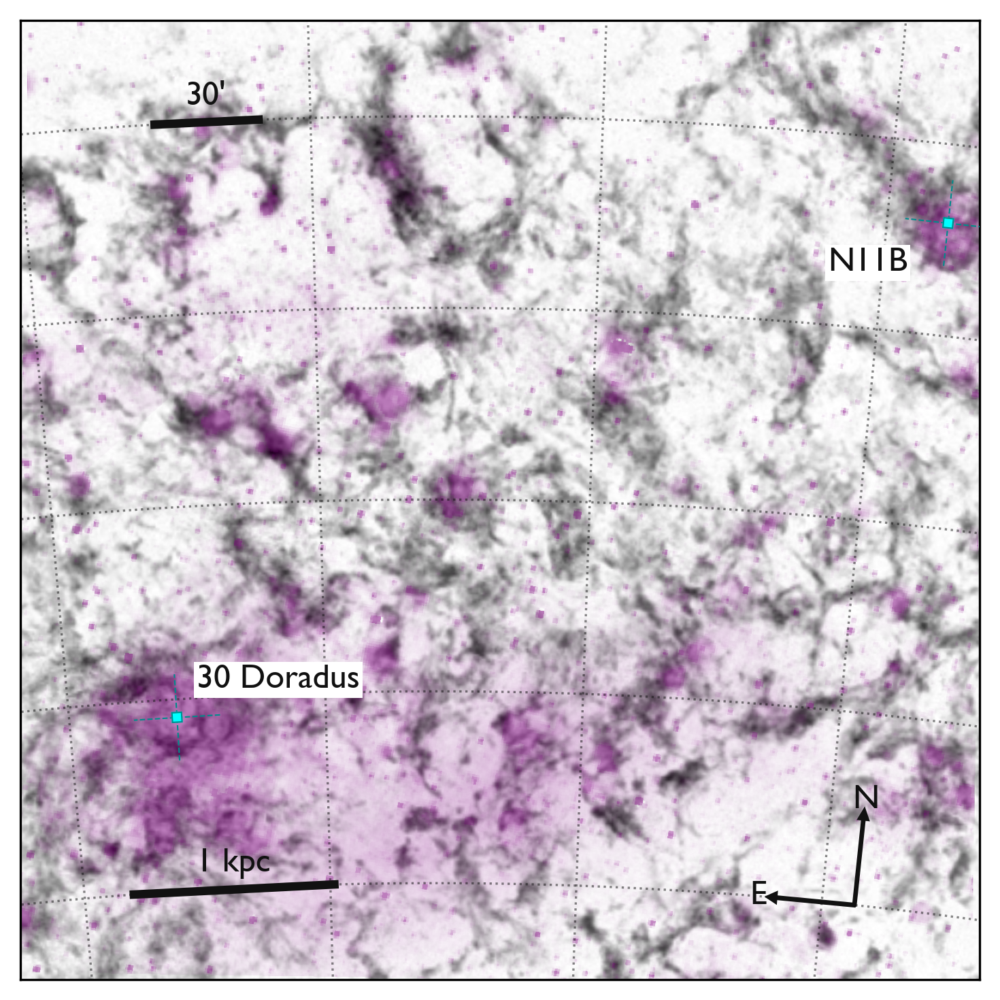

In [30]:
little_boxes_on_the_hillside_color = "red" #470a0a
little_boxes_full_of_ticky_tacky_color = "#00FFFF"

fits_path_red = "LMC_DSS2_red.fits"

fits_path_atca_hi = "/Users/billyli/Documents/float-for-morrow/LMC_HI_ATCA_peak.fits"

def load_2d_fits(path):
    hdul = fits.open(path)
    hdu = hdul[0]
    data = hdu.data
    wcs = WCS(hdu.header)
    if data is not None and data.ndim > 2:
        data = np.squeeze(data)
    return data, wcs, hdul

red, wcs_r, hdul_r = load_2d_fits(fits_path_red)

target_wcs = wcs_r
target_shape = red.shape

hi_data, hi_wcs_full, hi_hdul = load_2d_fits(fits_path_atca_hi)

hi_wcs_2d = hi_wcs_full.celestial

hi_atca_projected, _ = reproject_interp((hi_data, hi_wcs_2d), target_wcs, shape_out = target_shape)

slit_position = SkyCoord("05h38m53.6s", "-69d05m07.4s", frame = "icrs")
ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 - 0.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 - 0.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

fig = plt.figure(figsize = (5, 5), dpi = 300)
ax = fig.add_subplot(111, projection = target_wcs)

zoom_width = 300 * u.arcmin
zoom_height = 300 * u.arcmin

x_center_sky = SkyCoord("05h20m00.0s", "-68d00m00s", frame = "icrs")
x_center, y_center = target_wcs.world_to_pixel(x_center_sky)
cdelt = np.abs(target_wcs.wcs.cdelt)
pixscale_deg = cdelt[0]

zoom_width_pix  = (zoom_width.to(u.deg).value)  / pixscale_deg
zoom_height_pix = (zoom_height.to(u.deg).value) / pixscale_deg

ax.set_xlim(x_center - zoom_width_pix / 2, x_center + zoom_width_pix / 2)
ax.set_ylim(y_center - zoom_height_pix / 2, y_center + zoom_height_pix / 2)

light_purple_hex = "#800080" 
purple_cmap = mcolors.LinearSegmentedColormap.from_list("purple", ["#80008000", "#800080FF"])

cyan_hex = "#00FFFF" 
cyan_cmap = mcolors.LinearSegmentedColormap.from_list("cyan", ["#00FFFF00", "#00FFFFFF"])
        
im = ax.imshow(hi_atca_projected, origin = "lower", cmap = "grey_r", vmin = 10, zorder = -1)

ha_data, ha_wcs_full, ha_hdul = load_2d_fits("/Users/billyli/Documents/float-for-morrow/skv1996458954405.fits")

ha_reprojected, footprint = reproject_interp((ha_data, ha_wcs_full), target_wcs, shape_out = target_shape)

im_ha = ax.imshow(ha_reprojected, origin = 'lower', cmap = purple_cmap, alpha = 0.5, norm = LogNorm(vmin = 1000, vmax = 5000))

# cbar_ha = plt.colorbar(im_ha, ax = ax, pad = 0.1)
# cbar_ha.set_label(r'H$\alpha$ Intensity (dR)')

# cbar = plt.colorbar(im)
# cbar.set_label(r'HI 21 cm T$_{\text{peak}}$')

ax.set_xlabel("RA")
ax.set_ylabel("Dec")
ax.grid(color = "#111111", ls = ":", alpha = 0.5)

ax.coords[0].set_major_formatter("hh:mm:ss")
ax.coords[1].set_major_formatter("dd:mm")

poly = Polygon(corners, closed = True, fill = True, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, facecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = 'darkcyan', transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)

ra_center = (ra_min_w + ra_max_w) / 2
dec_center = (dec_min + dec_max) / 2

ax.plot([ra_min_w - 0.2 / np.cos(np.deg2rad(slit_position.dec.deg)), ra_max_w + 0.2 / np.cos(np.deg2rad(slit_position.dec.deg))], [dec_center, dec_center], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)
ax.plot([ra_center, ra_center], [dec_min - 0.2, dec_max + 0.2], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c - 90 / 60, dec_c + 10 / 60, "30 Doradus", transform = ax.get_transform("world"), color = "#111111", fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 1.0))
# txt = ax.text(ra_c, dec_c + 10 / 60, "30 Doradus", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)
# txt.set_path_effects([PathEffects.withStroke(linewidth = 1, foreground = "#111111")])

slit_position = SkyCoord('04h56m46.9s', '−66d24m37.9s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 0.2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 0.2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = True, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, facecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = 'darkcyan', transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)

ra_center = (ra_min_w + ra_max_w) / 2
dec_center = (dec_min + dec_max) / 2

ax.plot([ra_min_w - 0.2 / np.cos(np.deg2rad(slit_position.dec.deg)), ra_max_w + 0.2 / np.cos(np.deg2rad(slit_position.dec.deg))], [dec_center, dec_center], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)
ax.plot([ra_center, ra_center], [dec_min - 0.2, dec_max + 0.2], linestyle = '--', linewidth = 0.5, color = 'darkcyan', transform = ax.get_transform("world"), zorder = 96)

# poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
# ax.add_patch(poly)
# poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
# ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 60 / 60, dec_c - 15 / 60, "N11B", transform = ax.get_transform("world"), color = "#111111", fontsize = 12, ha = "center", va = "center", zorder = 100, bbox = dict(facecolor = 'white', edgecolor = 'none', pad = 1.0))
# txt = ax.text(ra_c + 80 / 60, dec_c, "LMC N11B", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)
# txt.set_path_effects([PathEffects.withStroke(linewidth = 1, foreground = "#111111")])

ra_min = x_center_sky.ra.deg - zoom_width.to(u.deg).value / 2
ra_max = x_center_sky.ra.deg + zoom_width.to(u.deg).value / 2
dec_min = x_center_sky.dec.deg - zoom_height.to(u.deg).value / 2
dec_max = x_center_sky.dec.deg + zoom_height.to(u.deg).value / 2

d = 49.97 * 1000

scalebar_length = 1000
scalebar_length_degrees = (scalebar_length / d) * (180.0 / np.pi)
scalebar_x, scalebar_y = ra_max + 3, dec_min + 0.5
        
ax.plot([scalebar_x - scalebar_length_degrees / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_length_degrees / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, "1 kpc", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))

scalebar_angle_length = 30
scalebar_x, scalebar_y = ra_max + 2, dec_max - 0.5
        
ax.plot([scalebar_x - scalebar_angle_length / 60 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_angle_length / 60 / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, f"{scalebar_angle_length}'", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))
        
arrow_x, arrow_y = ra_min - 3, dec_min + 0.5

arrow_north = FancyArrow(arrow_x, arrow_y, 0, 0.5, transform = ax.get_transform("world"), width = 0.01 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_width = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_length = 0.05, length_includes_head = True, color = "#111111", clip_on = False)
arrow_east = FancyArrow(arrow_x, arrow_y, 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)), 0, transform = ax.get_transform("world"), width = 0.01, head_width = 0.05, head_length = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), length_includes_head = True, color = "#111111", clip_on = False)
        
ax.add_patch(arrow_north)
ax.add_patch(arrow_east)

ax.text(arrow_x, arrow_y + 0.5 + 0.05, "N", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
ax.text(arrow_x + 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)) + 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), arrow_y, "E", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
        
for coord in ax.coords:
    coord.set_ticks_visible(False)
    coord.set_ticklabel_visible(False)
    coord.set_axislabel("")

plt.tight_layout()

plt.savefig("LMC.png", dpi = 300, bbox_inches = "tight")
plt.show()

hdul_r.close()

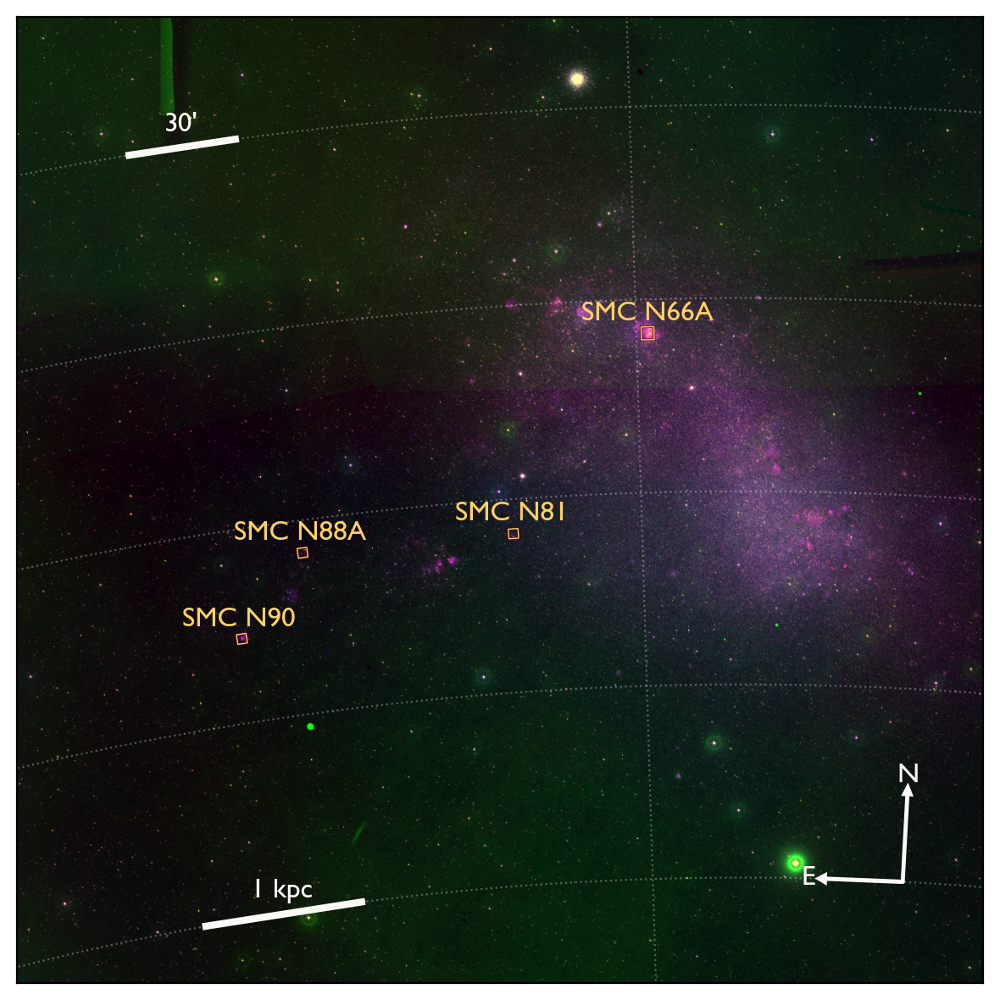

In [44]:
little_boxes_on_the_hillside_color = "#470a0a"
little_boxes_full_of_ticky_tacky_color = "#FFD166"

fits_path_red = "SMC_DSS2_red.fits"
fits_path_blue = "SMC_DSS2_blue.fits"
fits_path_nir = "SMC_DSS2_NIR.fits"

def load_2d_fits(path):
    hdul = fits.open(path)
    hdu = hdul[0]
    data = hdu.data
    wcs = WCS(hdu.header)
    if data is not None and data.ndim > 2:
        data = np.squeeze(data)
    return data, wcs, hdul

def normalize_channel(img, p_low = 0.5, p_high = 99.9, stretch_strength = 1):

    img = np.asarray(img, dtype = float)

    interval = PercentileInterval(p_high - p_low)
    vmin, vmax = interval.get_limits(img)

    vmax = vmax * 2

    img_clip = np.clip(img, vmin, vmax)
    img_out = (img_clip - vmin) / (vmax - vmin)

    # stretch = AsinhStretch(a = 1 / stretch_strength)
    # img_out = stretch(img_norm)

    img_out = np.clip(img_out, 0, 1)
    img_out[~np.isfinite(img_out)] = 0

    return img_out

red, wcs_r, hdul_r = load_2d_fits(fits_path_red)
blue, wcs_b, hdul_b = load_2d_fits(fits_path_blue)
nir, wcs_n, hdul_n = load_2d_fits(fits_path_nir)

target_wcs = wcs_r
target_shape = red.shape

if blue.shape != target_shape:
    blue, _ = reproject_interp((blue, wcs_b), target_wcs, shape_out = target_shape)
if nir.shape != target_shape:
    nir, _ = reproject_interp((nir, wcs_n), target_wcs, shape_out = target_shape)

slit_position = SkyCoord('01h24m08.3s', '−73d09m04.6s', frame = 'icrs')
ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 - 1 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 - 1 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

B = normalize_channel(blue)
R = normalize_channel(red)
NIR = normalize_channel(nir)

B_out = (B + R) / 2
G_out = np.zeros_like(B)
R_out = NIR

B_out = B
G_out = NIR
R_out = R

rgb = np.dstack([R_out, G_out, B_out])

fig = plt.figure(figsize = (6, 6), dpi = 200)
ax = fig.add_subplot(111, projection = target_wcs)

zoom_width = 300 * u.arcmin
zoom_height = 300 * u.arcmin

x_center_sky = SkyCoord("01h10m00.0s", "-73d00m00s", frame = "icrs")
x_center, y_center = target_wcs.world_to_pixel(x_center_sky)
cdelt = np.abs(target_wcs.wcs.cdelt)
pixscale_deg = cdelt[0]

zoom_width_pix  = (zoom_width.to(u.deg).value)  / pixscale_deg
zoom_height_pix = (zoom_height.to(u.deg).value) / pixscale_deg

ax.set_xlim(x_center - zoom_width_pix / 2, x_center + zoom_width_pix / 2)
ax.set_ylim(y_center - zoom_height_pix / 2, y_center + zoom_height_pix / 2)

ax.imshow(rgb, origin = "lower")

ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(color = "white", ls = ":", alpha = 0.3)

ax.coords[0].set_major_formatter("hh")
ax.coords[1].set_major_formatter("dd")

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N88A", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('01h29m36.1s', '−73d33m51.9s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N90", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('00h59m14.3s', '-72d11m02.8s', frame = 'icrs')

ra_min = slit_position.ra.deg - 2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 0.06 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 0.06 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 2 / 60 + 0.5 / 60
dec_max = slit_position.dec.deg + 2 / 60 + 0.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N66A", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('01h09m12.8s', '−73d11m36.90s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 + 0.9 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 + 0.9 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N81", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

ra_min = x_center_sky.ra.deg - zoom_width.to(u.deg).value / 2
ra_max = x_center_sky.ra.deg + zoom_width.to(u.deg).value / 2
dec_min = x_center_sky.dec.deg - zoom_height.to(u.deg).value / 2
dec_max = x_center_sky.dec.deg + zoom_height.to(u.deg).value / 2

d = 62.1 * 1000

scalebar_length = 1000
scalebar_length_degrees = (scalebar_length / d) * (180.0 / np.pi)
scalebar_x, scalebar_y = ra_max + 4, dec_min + 0.5
        
ax.plot([scalebar_x - scalebar_length_degrees / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#FAF9F6", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_length_degrees / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, "1 kpc", color = "#FAF9F6", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))

scalebar_angle_length = 30
scalebar_x, scalebar_y = ra_max + 3, dec_max - 0.5
        
ax.plot([scalebar_x - scalebar_angle_length / 60 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#FAF9F6", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_angle_length / 60 / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, f"{scalebar_angle_length}'", color = "#FAF9F6", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))
        
arrow_x, arrow_y = ra_min - 5, dec_min + 0.5

arrow_north = FancyArrow(arrow_x, arrow_y, 0, 0.5, transform = ax.get_transform("world"), width = 0.01 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_width = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_length = 0.05, length_includes_head = True, color = "#FAF9F6", clip_on = False)
arrow_east = FancyArrow(arrow_x, arrow_y, 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)), 0, transform = ax.get_transform("world"), width = 0.01, head_width = 0.05, head_length = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), length_includes_head = True, color = "#FAF9F6", clip_on = False)
        
ax.add_patch(arrow_north)
ax.add_patch(arrow_east)

ax.text(arrow_x, arrow_y + 0.5 + 0.05, "N", color = "#FAF9F6", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
ax.text(arrow_x + 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)) + 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), arrow_y, "E", color = "#FAF9F6", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
        
for coord in ax.coords:
    coord.set_ticks_visible(False)
    coord.set_ticklabel_visible(False)
    coord.set_axislabel("")

plt.tight_layout()

plt.savefig('SMC.png', dpi = 300, bbox_inches = "tight")
plt.show()

hdul_r.close()
hdul_b.close()
hdul_n.close()

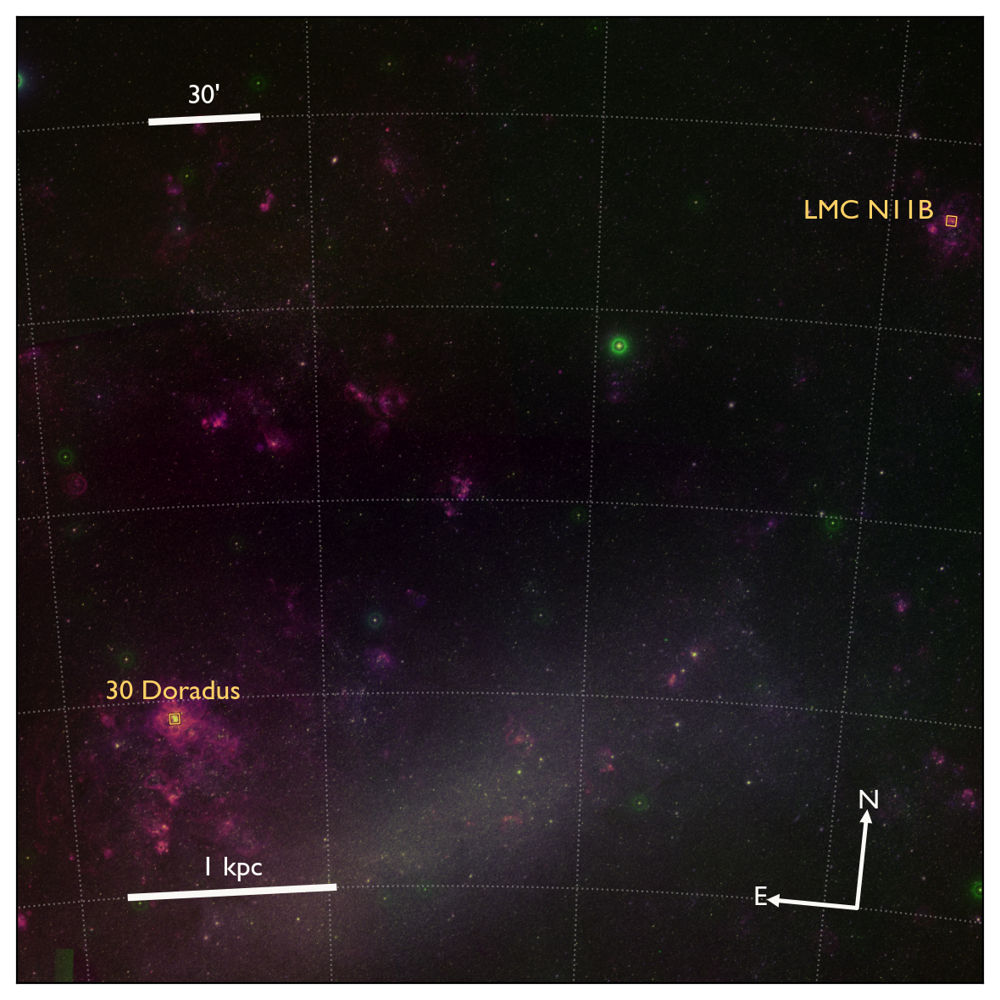

In [43]:
def normalize_channel(img, p_low = 0.5, p_high = 99.9, stretch_strength = 1):

    img = np.asarray(img, dtype = float)

    interval = PercentileInterval(p_high - p_low)
    vmin, vmax = interval.get_limits(img)

    vmax = vmax * 3

    img_clip = np.clip(img, vmin, vmax)
    img_out = (img_clip - vmin) / (vmax - vmin)

    # stretch = AsinhStretch(a = 1 / stretch_strength)
    # img_out = stretch(img_norm)

    img_out = np.clip(img_out, 0, 1)
    img_out[~np.isfinite(img_out)] = 0

    return img_out

fits_path_red = "LMC_DSS2_red.fits"
fits_path_blue = "LMC_DSS2_blue.fits"
fits_path_nir = "LMC_DSS2_NIR.fits"

def load_2d_fits(path):
    hdul = fits.open(path)
    hdu = hdul[0]
    data = hdu.data
    wcs = WCS(hdu.header)
    if data is not None and data.ndim > 2:
        data = np.squeeze(data)
    return data, wcs, hdul

red, wcs_r, hdul_r = load_2d_fits(fits_path_red)
blue, wcs_b, hdul_b = load_2d_fits(fits_path_blue)
nir, wcs_n, hdul_n = load_2d_fits(fits_path_nir)

target_wcs = wcs_r
target_shape = red.shape

if blue.shape != target_shape:
    blue, _ = reproject_interp((blue, wcs_b), target_wcs, shape_out = target_shape)
if nir.shape != target_shape:
    nir, _ = reproject_interp((nir, wcs_n), target_wcs, shape_out = target_shape)

slit_position = SkyCoord("05h38m53.6s", "-69d05m07.4s", frame = "icrs")
ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 - 0.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 - 0.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

B = normalize_channel(blue)
R = normalize_channel(red)
NIR = normalize_channel(nir)

B_out = (B + R) / 2
G_out = np.zeros_like(B)
R_out = NIR

B_out = B
G_out = NIR
R_out = R

rgb = np.dstack([R_out, G_out, B_out])

fig = plt.figure(figsize = (6, 6), dpi = 200)
ax = fig.add_subplot(111, projection = target_wcs)

zoom_width = 300 * u.arcmin
zoom_height = 300 * u.arcmin

x_center_sky = SkyCoord("05h20m00.0s", "-68d00m00s", frame = "icrs")
x_center, y_center = target_wcs.world_to_pixel(x_center_sky)
cdelt = np.abs(target_wcs.wcs.cdelt)
pixscale_deg = cdelt[0]

zoom_width_pix  = (zoom_width.to(u.deg).value)  / pixscale_deg
zoom_height_pix = (zoom_height.to(u.deg).value) / pixscale_deg

ax.set_xlim(x_center - zoom_width_pix / 2, x_center + zoom_width_pix / 2)
ax.set_ylim(y_center - zoom_height_pix / 2, y_center + zoom_height_pix / 2)

ax.imshow(rgb, origin = "lower")

ax.set_xlabel("RA")
ax.set_ylabel("Dec")
ax.grid(color = "white", ls = ":", alpha = 0.3)

ax.coords[0].set_major_formatter("hh:mm:ss")
ax.coords[1].set_major_formatter("dd:mm")

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 8 / 60, "30 Doradus", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('04h56m46.9s', '−66d24m37.9s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 0.2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 0.2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 65 / 60, dec_c, "LMC N11B", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

ra_min = x_center_sky.ra.deg - zoom_width.to(u.deg).value / 2
ra_max = x_center_sky.ra.deg + zoom_width.to(u.deg).value / 2
dec_min = x_center_sky.dec.deg - zoom_height.to(u.deg).value / 2
dec_max = x_center_sky.dec.deg + zoom_height.to(u.deg).value / 2

d = 49.97 * 1000

scalebar_length = 1000
scalebar_length_degrees = (scalebar_length / d) * (180.0 / np.pi)
scalebar_x, scalebar_y = ra_max + 3, dec_min + 0.5
        
ax.plot([scalebar_x - scalebar_length_degrees / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#FAF9F6", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_length_degrees / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, "1 kpc", color = "#FAF9F6", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))

scalebar_angle_length = 30
scalebar_x, scalebar_y = ra_max + 2, dec_max - 0.5
        
ax.plot([scalebar_x - scalebar_angle_length / 60 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#FAF9F6", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_angle_length / 60 / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, f"{scalebar_angle_length}'", color = "#FAF9F6", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))
        
arrow_x, arrow_y = ra_min - 3, dec_min + 0.5

arrow_north = FancyArrow(arrow_x, arrow_y, 0, 0.5, transform = ax.get_transform("world"), width = 0.01 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_width = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_length = 0.05, length_includes_head = True, color = "#FAF9F6", clip_on = False)
arrow_east = FancyArrow(arrow_x, arrow_y, 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)), 0, transform = ax.get_transform("world"), width = 0.01, head_width = 0.05, head_length = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), length_includes_head = True, color = "#FAF9F6", clip_on = False)
        
ax.add_patch(arrow_north)
ax.add_patch(arrow_east)

ax.text(arrow_x, arrow_y + 0.5 + 0.05, "N", color = "#FAF9F6", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
ax.text(arrow_x + 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)) + 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), arrow_y, "E", color = "#FAF9F6", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
        
for coord in ax.coords:
    coord.set_ticks_visible(False)
    coord.set_ticklabel_visible(False)
    coord.set_axislabel("")

plt.tight_layout()

plt.savefig("LMC.png", dpi = 300, bbox_inches = "tight")
plt.show()

hdul_r.close()
hdul_b.close()
hdul_n.close()

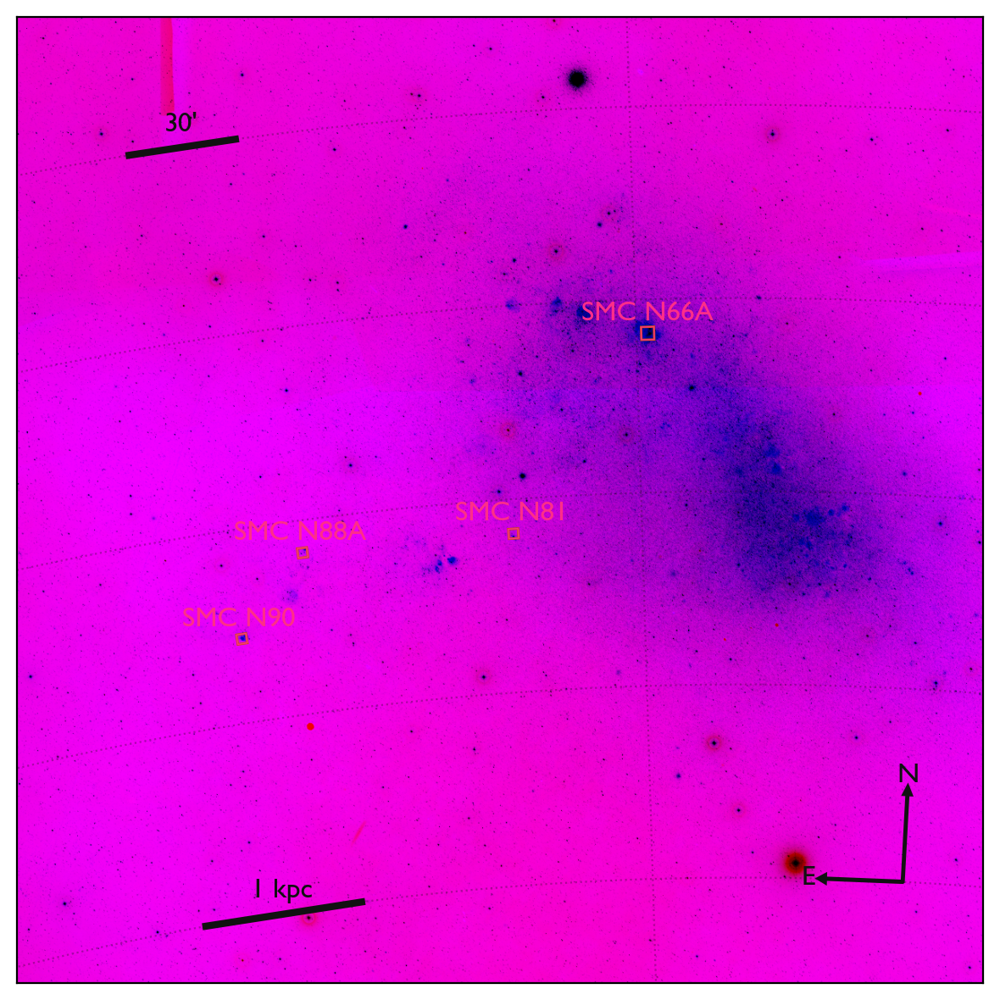

In [30]:
little_boxes_on_the_hillside_color = "#CC5500" #FF2E88
little_boxes_full_of_ticky_tacky_color = "#FF2E88" #9E2A2B

fits_path_red = "SMC_DSS2_red.fits"
fits_path_blue = "SMC_DSS2_blue.fits"
fits_path_nir = "SMC_DSS2_NIR.fits"

def load_2d_fits(path):
    hdul = fits.open(path)
    hdu = hdul[0]
    data = hdu.data
    wcs = WCS(hdu.header)
    if data is not None and data.ndim > 2:
        data = np.squeeze(data)
    return data, wcs, hdul

def normalize_channel(img, p_low = 5, p_high = 99.99, stretch_strength = 1):

    img = np.asarray(img, dtype = float)

    interval = PercentileInterval(p_high - p_low)
    vmin, vmax = interval.get_limits(img)

    vmax = vmax * 2

    img_clip = np.clip(img, vmin, vmax)
    img_out = (img_clip - vmin) / (vmax - vmin)

    # stretch = AsinhStretch(a = 1 / stretch_strength)
    # img_out = stretch(img_norm)

    img_out = np.clip(img_out, 0, 1)
    img_out[~np.isfinite(img_out)] = 0

    return img_out

red, wcs_r, hdul_r = load_2d_fits(fits_path_red)
blue, wcs_b, hdul_b = load_2d_fits(fits_path_blue)
nir, wcs_n, hdul_n = load_2d_fits(fits_path_nir)

target_wcs = wcs_r
target_shape = red.shape

if blue.shape != target_shape:
    blue, _ = reproject_interp((blue, wcs_b), target_wcs, shape_out = target_shape)
if nir.shape != target_shape:
    nir, _ = reproject_interp((nir, wcs_n), target_wcs, shape_out = target_shape)

slit_position = SkyCoord('01h24m08.3s', '−73d09m04.6s', frame = 'icrs')
ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 - 1 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 - 1 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

B = normalize_channel(blue)
G = normalize_channel(red)
R = normalize_channel(nir)

B_out = B
G_out = G
a = 0.6
R_out = np.clip(R + a * G, 0, 1)

bgr = np.dstack([B_out, G_out, R_out])
rgb = bgr[..., ::-1]  

rgb = 1.0 - rgb

B = normalize_channel(blue)
R = normalize_channel(red)
NIR = normalize_channel(nir)

B_out = NIR
R_out = (R + B) / 2
G_out = np.ones_like(B) # (NIR + (R + B) / 2) / 2
rgb = np.dstack([R_out, G_out, B_out])
rgb = 1.0 - rgb

fig = plt.figure(figsize = (6, 6), dpi = 200)
ax = fig.add_subplot(111, projection = target_wcs)

zoom_width = 300 * u.arcmin
zoom_height = 300 * u.arcmin

x_center_sky = SkyCoord("01h10m00.0s", "-73d00m00s", frame = "icrs")
x_center, y_center = target_wcs.world_to_pixel(x_center_sky)
cdelt = np.abs(target_wcs.wcs.cdelt)
pixscale_deg = cdelt[0]

zoom_width_pix  = (zoom_width.to(u.deg).value)  / pixscale_deg
zoom_height_pix = (zoom_height.to(u.deg).value) / pixscale_deg

ax.set_xlim(x_center - zoom_width_pix / 2, x_center + zoom_width_pix / 2)
ax.set_ylim(y_center - zoom_height_pix / 2, y_center + zoom_height_pix / 2)

ax.imshow(rgb, origin = "lower")

ax.set_xlabel("RA (J2000)")
ax.set_ylabel("Dec (J2000)")
ax.grid(color = "#111111", ls = ":", alpha = 0.3)

ax.coords[0].set_major_formatter("hh")
ax.coords[1].set_major_formatter("dd")

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N88A", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('01h29m36.1s', '−73d33m51.9s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N90", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('00h59m14.3s', '-72d11m02.8s', frame = 'icrs')

ra_min = slit_position.ra.deg - 2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 0.06 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 0.06 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 2 / 60 + 0.5 / 60
dec_max = slit_position.dec.deg + 2 / 60 + 0.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N66A", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('01h09m12.8s', '−73d11m36.90s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 + 0.9 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 + 0.9 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 6 / 60, "SMC N81", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

ra_min = x_center_sky.ra.deg - zoom_width.to(u.deg).value / 2
ra_max = x_center_sky.ra.deg + zoom_width.to(u.deg).value / 2
dec_min = x_center_sky.dec.deg - zoom_height.to(u.deg).value / 2
dec_max = x_center_sky.dec.deg + zoom_height.to(u.deg).value / 2

d = 62.1 * 1000

scalebar_length = 1000
scalebar_length_degrees = (scalebar_length / d) * (180.0 / np.pi)
scalebar_x, scalebar_y = ra_max + 4, dec_min + 0.5
        
ax.plot([scalebar_x - scalebar_length_degrees / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_length_degrees / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, "1 kpc", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))

scalebar_angle_length = 30
scalebar_x, scalebar_y = ra_max + 3, dec_max - 0.5
        
ax.plot([scalebar_x - scalebar_angle_length / 60 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_angle_length / 60 / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, f"{scalebar_angle_length}'", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))
        
arrow_x, arrow_y = ra_min - 5, dec_min + 0.5

arrow_north = FancyArrow(arrow_x, arrow_y, 0, 0.5, transform = ax.get_transform("world"), width = 0.01 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_width = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_length = 0.05, length_includes_head = True, color = "#111111", clip_on = False)
arrow_east = FancyArrow(arrow_x, arrow_y, 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)), 0, transform = ax.get_transform("world"), width = 0.01, head_width = 0.05, head_length = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), length_includes_head = True, color = "#111111", clip_on = False)
        
ax.add_patch(arrow_north)
ax.add_patch(arrow_east)

ax.text(arrow_x, arrow_y + 0.5 + 0.05, "N", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
ax.text(arrow_x + 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)) + 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), arrow_y, "E", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
        
for coord in ax.coords:
    coord.set_ticks_visible(False)
    coord.set_ticklabel_visible(False)
    coord.set_axislabel("")

plt.tight_layout()

plt.savefig('SMC_inverted.png', dpi = 300, bbox_inches = "tight")
plt.show()

hdul_r.close()
hdul_b.close()
hdul_n.close()

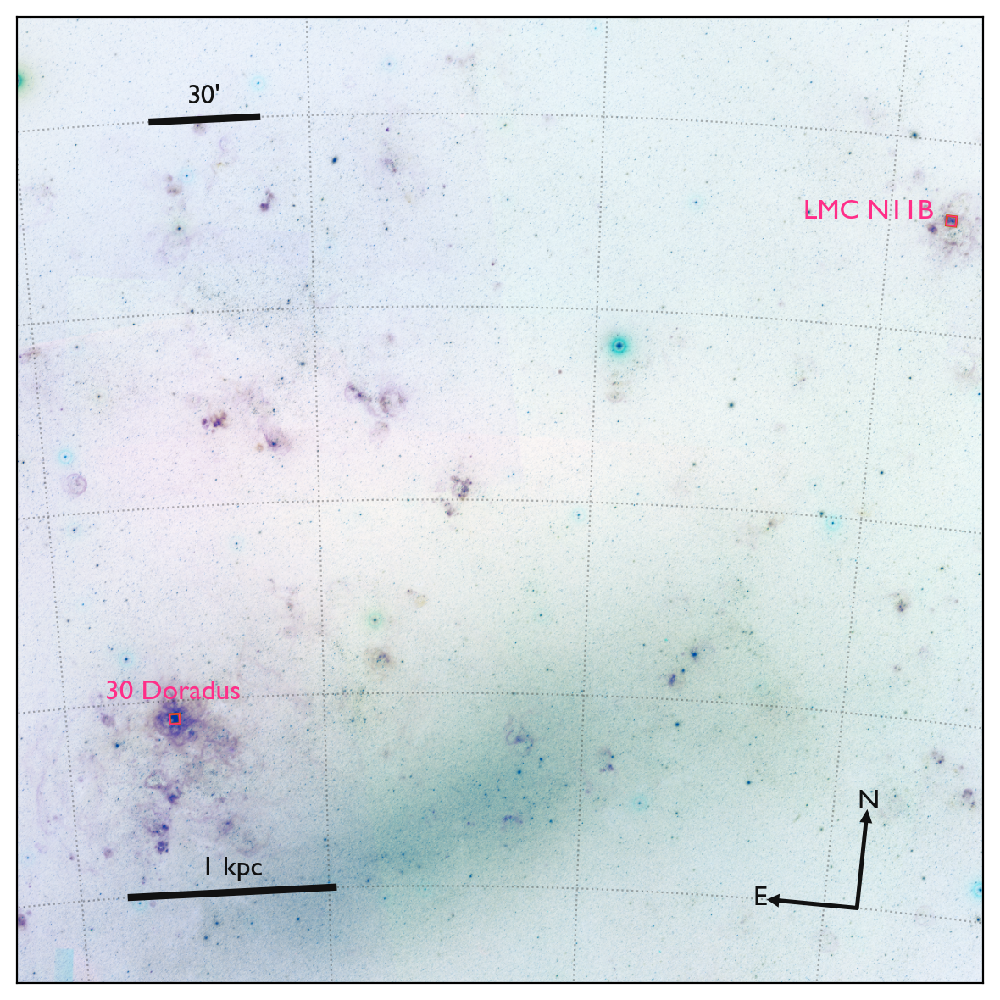

In [7]:
def normalize_channel(img, p_low = 0.5, p_high = 99.99, stretch_strength = 1):

    img = np.asarray(img, dtype = float)

    interval = PercentileInterval(p_high - p_low)
    vmin, vmax = interval.get_limits(img)

    vmax = vmax * 3

    img_clip = np.clip(img, vmin, vmax)
    img_norm = (img_clip - vmin) / (vmax - vmin)

    stretch = AsinhStretch(a = 1 / stretch_strength)
    img_out = stretch(img_norm)

    img_out = np.clip(img_out, 0, 1)
    img_out[~np.isfinite(img_out)] = 0

    return img_out

fits_path_red = "LMC_DSS2_red.fits"
fits_path_blue = "LMC_DSS2_blue.fits"
fits_path_nir = "LMC_DSS2_NIR.fits"

def load_2d_fits(path):
    hdul = fits.open(path)
    hdu = hdul[0]
    data = hdu.data
    wcs = WCS(hdu.header)
    if data is not None and data.ndim > 2:
        data = np.squeeze(data)
    return data, wcs, hdul

red, wcs_r, hdul_r = load_2d_fits(fits_path_red)
blue, wcs_b, hdul_b = load_2d_fits(fits_path_blue)
nir, wcs_n, hdul_n = load_2d_fits(fits_path_nir)

target_wcs = wcs_r
target_shape = red.shape

if blue.shape != target_shape:
    blue, _ = reproject_interp((blue, wcs_b), target_wcs, shape_out = target_shape)
if nir.shape != target_shape:
    nir, _ = reproject_interp((nir, wcs_n), target_wcs, shape_out = target_shape)

slit_position = SkyCoord("05h38m53.6s", "-69d05m07.4s", frame = "icrs")
ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) - 1 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60 - 0.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60 - 0.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

B = normalize_channel(blue)
G = normalize_channel(red)
R = normalize_channel(nir)

B_out = B
G_out = G
a = 0.6
R_out = np.clip(R + a * G, 0, 1)

bgr = np.dstack([B_out, G_out, R_out])
rgb = bgr[..., ::-1]  

rgb = 1.0 - rgb

fig = plt.figure(figsize = (6, 6), dpi = 200)
ax = fig.add_subplot(111, projection = target_wcs)

zoom_width = 300 * u.arcmin
zoom_height = 300 * u.arcmin

x_center_sky = SkyCoord("05h20m00.0s", "-68d00m00s", frame = "icrs")
x_center, y_center = target_wcs.world_to_pixel(x_center_sky)
cdelt = np.abs(target_wcs.wcs.cdelt)
pixscale_deg = cdelt[0]

zoom_width_pix  = (zoom_width.to(u.deg).value)  / pixscale_deg
zoom_height_pix = (zoom_height.to(u.deg).value) / pixscale_deg

ax.set_xlim(x_center - zoom_width_pix / 2, x_center + zoom_width_pix / 2)
ax.set_ylim(y_center - zoom_height_pix / 2, y_center + zoom_height_pix / 2)

ax.imshow(rgb, origin = "lower")

ax.set_xlabel("RA")
ax.set_ylabel("Dec")
ax.grid(color = "#111111", ls = ":", alpha = 0.3)

ax.coords[0].set_major_formatter("hh:mm:ss")
ax.coords[1].set_major_formatter("dd:mm")

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c, dec_c + 8 / 60, "30 Doradus", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

slit_position = SkyCoord('04h56m46.9s', '−66d24m37.9s', frame = 'icrs')

ra_min = slit_position.ra.deg - 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 0.2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
ra_max = slit_position.ra.deg + 1.5 / 60 / np.cos(np.deg2rad(slit_position.dec.deg)) + 0.2 / 60 / np.cos(np.deg2rad(slit_position.dec.deg))
dec_min = slit_position.dec.deg - 1.5 / 60
dec_max = slit_position.dec.deg + 1.5 / 60

ra_min_w = Angle(ra_min, unit = u.deg).wrap_at(180 * u.deg).deg
ra_max_w = Angle(ra_max, unit = u.deg).wrap_at(180 * u.deg).deg

corners = np.array([[ra_min_w, dec_min], [ra_max_w, dec_min], [ra_max_w, dec_max], [ra_min_w, dec_max]])

poly = Polygon(corners, closed = True, fill = False, lw = 1, edgecolor = little_boxes_on_the_hillside_color, transform = ax.get_transform("world"), zorder = 98)
ax.add_patch(poly)
poly = Polygon(corners, closed = True, fill = False, lw = 0.5, edgecolor = little_boxes_full_of_ticky_tacky_color, transform = ax.get_transform("world"), zorder = 99)
ax.add_patch(poly)

ra_c = np.mean(corners[:, 0])
dec_c = np.mean(corners[:, 1])

txt = ax.text(ra_c + 65 / 60, dec_c, "LMC N11B", transform = ax.get_transform("world"), color = little_boxes_full_of_ticky_tacky_color, fontsize = 12, ha = "center", va = "center", zorder = 100)

ra_min = x_center_sky.ra.deg - zoom_width.to(u.deg).value / 2
ra_max = x_center_sky.ra.deg + zoom_width.to(u.deg).value / 2
dec_min = x_center_sky.dec.deg - zoom_height.to(u.deg).value / 2
dec_max = x_center_sky.dec.deg + zoom_height.to(u.deg).value / 2

d = 49.97 * 1000

scalebar_length = 1000
scalebar_length_degrees = (scalebar_length / d) * (180.0 / np.pi)
scalebar_x, scalebar_y = ra_max + 3, dec_min + 0.5
        
ax.plot([scalebar_x - scalebar_length_degrees / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_length_degrees / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, "1 kpc", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))

scalebar_angle_length = 30
scalebar_x, scalebar_y = ra_max + 2, dec_max - 0.5
        
ax.plot([scalebar_x - scalebar_angle_length / 60 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_x], [scalebar_y, scalebar_y], color = "#111111", lw = 3, transform = ax.get_transform("world"))
ax.text(scalebar_x - scalebar_angle_length / 60 / 2.0 / np.cos(np.deg2rad(x_center_sky.dec.deg)), scalebar_y + 0.05, f"{scalebar_angle_length}'", color = "#111111", fontsize = 12, ha = "center", va = "bottom", weight = "bold", transform = ax.get_transform("world"))
        
arrow_x, arrow_y = ra_min - 3, dec_min + 0.5

arrow_north = FancyArrow(arrow_x, arrow_y, 0, 0.5, transform = ax.get_transform("world"), width = 0.01 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_width = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), head_length = 0.05, length_includes_head = True, color = "#111111", clip_on = False)
arrow_east = FancyArrow(arrow_x, arrow_y, 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)), 0, transform = ax.get_transform("world"), width = 0.01, head_width = 0.05, head_length = 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), length_includes_head = True, color = "#111111", clip_on = False)
        
ax.add_patch(arrow_north)
ax.add_patch(arrow_east)

ax.text(arrow_x, arrow_y + 0.5 + 0.05, "N", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
ax.text(arrow_x + 0.5 / np.cos(np.deg2rad(x_center_sky.dec.deg)) + 0.05 / np.cos(np.deg2rad(x_center_sky.dec.deg)), arrow_y, "E", color = "#111111", fontsize = 12, ha = "center", va = "center", weight = "bold", transform = ax.get_transform("world"))
        
for coord in ax.coords:
    coord.set_ticks_visible(False)
    coord.set_ticklabel_visible(False)
    coord.set_axislabel("")

plt.tight_layout()

plt.savefig("LMC_inverted.png", dpi = 300, bbox_inches = "tight")
plt.show()

hdul_r.close()
hdul_b.close()
hdul_n.close()